<a href="https://colab.research.google.com/github/sshuklz/MUTSEARCH_DATAFILES/blob/master/DomainSearch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Run URL by clicking play button below to connect to datafiles (may need more permenant solution)

In [ ]:
CDSlibrary = 'https://media.githubusercontent.com/media/sshuklz/MUTSEARCH_DATAFILES/master/Human_full_CDS_libraryV2.csv'
RefTable = 'https://media.githubusercontent.com/media/sshuklz/MUTSEARCH_DATAFILES/master/Exon2SeqDictionary.csv'
CancerStudy = 'https://media.githubusercontent.com/media/sshuklz/MUTSEARCH_DATAFILES/master/cancer_study_id.csv'

Specify the following variables for search: Reps, Size and Gap_allowance. YOU HAVE TO click all play buttons in order for search parameters to be updated. 






Nucleotide repeat search and Gene dictionary creation:


In [ ]:
#@title Default title text
# give a list of amino acids in quotes i.e: 'CAG', 'GAA', 'GCGCGTT', note if multiple repeats entered at once i.e: ['CAG', 'GTA'] they must have same length, 
Reps = ['GAG','GAA','GAT','GAC']

# give repeat stretch minimum size i.e: for 'CAG' and Size = 4 repeats the following are returned: CAGCAGCAGCAG, CAGCAGCAGCAGCAGCAG but not CAGCAG
Size = 20

# strech of nucleic bases allowed inbetween repeats ie. if Gap_allowance = 1 and 'CAG' repeats, CAG - 'TTT' - CAGCAGCAGCAG - 'CATGGG' - CAGCAGCAGCAGCAG output is CAGTTTCAGCAGCAGCAG 
Gap_allowance = 0

In [ ]:
#@title Search results

import codecs
import requests
from contextlib import closing
import csv
import pandas as pd

import sys, subprocess; subprocess.call([sys.executable, "-m", "pip", "install", 'biopython']); print('biopython' + ' installed\n')
from Bio.Seq import Seq
from Bio.Alphabet import generic_dna

RepLen=0 # repeat length
ResNum=0 # Residue count
DomainLen=0 # domain sequence count
GapNum=0 # Non repeat in continous seq

DNAseq = []
Gene = []
Coord = []
Gene_list = [' ']
Gene_ref_list = [' ']
Gene_dict = pd.DataFrame(columns=['Gene','Transcript','CHR','Exon_num','Exon_ST','Exon_ED','Rep_ST','Rep_ED','Coding_LEN','Exon_LEN','Rep_LEN','Sense'])

GapLength = len(Reps[0])
with closing(requests.get(CDSlibrary, stream=True)) as r:
    reader = csv.reader(codecs.iterdecode(r.iter_lines(), 'utf-8'), delimiter=',') 
    
    for row in reader:
        
        DomainLen = 0
        ResNum = 0
        GapNum = 0
        
        for CodonPos in range (round(len(row[2])/3)):
            DomainLen += GapLength
            RepLen += GapLength
            if row[2][DomainLen-3:DomainLen] in Reps : # repeat residues
                ResNum += 1
                GapNum = 0

            else:
                GapNum += GapLength

                if GapNum >= Gap_allowance*GapLength:

                    if ResNum >= Size: 
                        
                        Gene_ref = row[0] + ': ' + row[1]; Up_down_stream_adj = 0
                        Coord = [((CodonPos*GapLength) - RepLen + 3),(CodonPos*GapLength)+(GapLength*2) - GapNum - 3]
                        
                        with closing(requests.get(RefTable, stream=True)) as r:
                            reader = csv.reader(codecs.iterdecode(r.iter_lines(), 'utf-8'), delimiter=',') 
                            for ref in reader:
                               
                                if ref[1] == row[1]:
                                    stop = 0; Rep_ST = 0; Rep_ED = 0
                                    
                                    if int(ref[8]) == 1:
                                            
                                        if Coord[0] > int(ref[7]) or Coord[1] < int(ref[6]):
                                            stop = 1; Up_down_stream_adj = 0
                                        
                                        Rep_ST = int(ref[3])
                                        Rep_ED = int(ref[4]) 
                                        
                                        if Coord[0] > int(ref[6]):
                                            Rep_ST = int(ref[3]) + (Coord[0] - int(ref[6])) - 1
                                            
                                        if Coord[1] < int(ref[7]):
                                            Rep_ED = int(ref[4]) - (int(ref[7]) - Coord[1]) - 1 + Up_down_stream_adj
                                               
                                    if int(ref[8]) == -1:
                                            
                                        if Coord[0] > int(ref[7]) or Coord[1] < int(ref[6]):
                                            stop = 1; Up_down_stream_adj = 0
                                            
                                        Rep_ST = int(ref[3])
                                        Rep_ED = int(ref[4])
                                        
                                        if Coord[0] > int(ref[6]):
                                            Rep_ED = int(ref[4]) - (Coord[0] - int(ref[6]))
                                            
                                        if Coord[1] < int(ref[7]):
                                            Rep_ST = int(ref[3]) + (int(ref[7]) - Coord[1]) - Up_down_stream_adj
                                    
                                    Elen = int(ref[4]) - int(ref[3]); Rlen = Rep_ED - Rep_ST;
                                    
                                    if stop != 1:       
                                        Gene_dict = Gene_dict.append({'Gene': ref[0],'Transcript': ref[1],'CHR': ref[2],'Exon_num':ref[5],'Exon_ST': int(ref[3]),'Exon_ED': int(ref[4]),'Rep_ST': Rep_ST,'Rep_ED': Rep_ED,'Coding_LEN': len(row[2]),'Exon_LEN': Elen,'Rep_LEN': Rlen,'Sense': ref[8]}, ignore_index=True)
                                        Up_down_stream_adj = 1
                                    else:
                                        Up_down_stream_adj = 0
                                    
                        DNAseq = row[2][(CodonPos*GapLength)-RepLen:(CodonPos*GapLength)+(GapLength*2) - GapNum]
                        AAseq = Seq(DNAseq, generic_dna).translate()
                        
                        if row[0] not in Gene_list or Gene_ref in Gene_ref_list:
                            if row[0] not in Gene_list:
                                Gene_list = Gene_list + [row[0]]
                            
                            print(Gene_ref) 
                            print ('DNAseq: ' + str(DNAseq)) 
                            print('AAseq: ' + str(AAseq) +'\n')
                            
                        Gene_ref_list = Gene_ref_list + [Gene_ref]
                        
                    ResNum = 0
                    RepLen = 0

Gene_dict = Gene_dict.drop_duplicates(subset = ['Gene','Rep_ST','Rep_ED'])
print('Genes with repeating elements: ')                    
print(Gene_list[1:])
print('\n Refrence dictionary: \n')

with pd.option_context("display.max_rows", None, "display.max_columns", None):  
    display(Gene_dict.style.hide_index())

biopython installed

ANO8: ENST00000159087.4
DNAseq: AAGGAGGAGGACGAGGACGACGAGGAGGAGGAGGACGAGGAGGAAGAGGAGGACGAGGAGGAGGGC
AAseq: KEEDEDDEEEEDEEEEEDEEEG

ANP32E: ENST00000314136.8
DNAseq: TATGAGGAAGAGGAGGAGGAAGAGGAAGAGGAGGATGAGGATGAGGATGAAGATGAAGATGAAGCA
AAseq: YEEEEEEEEEEDEDEDEDEDEA

ATAD2: ENST00000287394.5
DNAseq: GGTGAAGATGAAGATGATGAAGATGATGATGATGATGACGATGATGATGATGATGATGATGATGAAGATGATGAAGATGAAGAAGATGGA
AAseq: GEDEDDEDDDDDDDDDDDDDDEDDEDEEDG

BCL11A: ENST00000335712.6
DNAseq: GGGGACGAGGAGGAAGAGGAGGACGACGAGGAAGAGGAAGAAGAGGAGGAAGAGGAGGAGGAGGAGCTG
AAseq: GDEEEEEDDEEEEEEEEEEEEEL

ARMH4: ENST00000267485.7
DNAseq: CAAGAAGATGAGGATGAAGAGGATGAAGAAGATGAAGATGAAGAAGAGGAAGATGAGGAAGAAGATGAGGAAGATAAA
AAseq: QEDEDEEDEEDEDEEEEDEEEDEEDK

CASZ1: ENST00000377022.3
DNAseq: GCCGAAGACGACGAGGACGAGGACGACGACGAGGACGACGACGACGAGGACGACGACGAGGACGACGACGACGAGGACCTG
AAseq: AEDDEDEDDDEDDDDEDDDEDDDDEDL

CENPB: ENST00000379751.4
DNAseq: AGTGAGGAAGAGGACGATGAGGAAGAGGATGATGAAGATGAAGACGACGATGATGATGAGGAGGATGGT
AAseq: SEEEDDEEED

Gene,Transcript,CHR,Exon_num,Exon_ST,Exon_ED,Rep_ST,Rep_ED,Coding_LEN,Exon_LEN,Rep_LEN,Sense
ANO8,ENST00000159087.4,19,13,17438971,17439792,17439394,17439454,3699,821,60,-1
ANP32E,ENST00000314136.8,1,5,150198940,150199127,150199009,150199069,807,187,60,-1
ATAD2,ENST00000287394.5,8,7,124382061,124382264,124382137,124382221,4173,203,84,-1
BCL11A,ENST00000335712.6,2,4,60687539,60689559,60688535,60688598,2508,2020,63,-1
ARMH4,ENST00000267485.7,14,5,58563442,58563699,58563620,58563692,2325,257,72,-1
CASZ1,ENST00000377022.3,1,21,10698999,10700116,10699137,10699212,5280,1117,75,-1
CENPB,ENST00000379751.4,20,1,3765331,3767130,3765526,3765589,1800,1799,63,-1
CHIC1,ENST00000373502.5,X,1,72783121,72783416,72783242,72783323,675,295,81,1
DCAF8L2,ENST00000451261.2,X,5,27765013,27766908,27765386,27765452,1896,1895,66,1
EHMT2,ENST00000375530.4,6,8,31857245,31857379,31857266,31857347,3531,134,81,-1


CBioPortal Query and mutation dataset fetch, Generate MUT dictionary: 

In [ ]:
#@title Search results
import pandas as pd
import requests
import codecs
from contextlib import closing
import csv
               
case_list = ' ' # TCGA cohort names
gene_profile = ' ' # TCGA cohort mutation data
gene_list = ("+".join(Gene_list))[2:] # carried over Gene_list

with closing(requests.get(CancerStudy, stream=True)) as r:
    reader = csv.reader(codecs.iterdecode(r.iter_lines(), 'utf-8')) 
    next(reader)
    for row in reader:
        case_list = case_list + "+" + ''.join(row)

case_list = case_list[2:]

with closing(requests.get(CancerStudy, stream=True)) as r:
    reader = csv.reader(codecs.iterdecode(r.iter_lines(), 'utf-8')) 
    next(reader)
    for row in reader:
        gene_profile = gene_profile + "_mutations+" + ''.join(row)

gene_profile = gene_profile[12:]
         
web_str = "https://www.cbioportal.org/webservice.do?cmd=getMutationData&case_set_id=" + \
            case_list + "&genetic_profile_id=" + gene_profile + "&gene_list=" + gene_list

print('Custom generated URL from refrence dictionary:')
print(web_str + "\n" )

import urllib.request    
urllib.request.urlretrieve(web_str, "CbioDATA.txt")

Mut_dict = pd.DataFrame(columns=['gene_symbol', 'case_id', 'sequencing_center', 'mutation_status', 'mutation_type', 'validation_status', 'amino_acid_change', 'functional_impact_score', 'xvar_link', 'xvar_link_pdb', 'xvar_link_msa', 'chr', 'start_position', 'end_position', 'reference_allele', 'variant_allele', 'reference_read_count_tumor', 'variant_read_count_tumor', 'reference_read_count_normal', 'variant_read_count_normal', 'genetic_profile_id','ExonMut','RepMut'])
Row_num = 0

print('Generating MutDict fromm CBio data (takes a while): \n')

with open ('CbioDATA.txt', 'r') as csv_file:
    csvread = csv.reader(csv_file, delimiter='\t')
    for row in csvread:
        if len(row) == 22 and row[12] != 'NA' and row != ['entrez_gene_id', 'gene_symbol', 'case_id', 'sequencing_center', 'mutation_status', 'mutation_type', 'validation_status', 'amino_acid_change', 'functional_impact_score', 'xvar_link', 'xvar_link_pdb', 'xvar_link_msa', 'chr', 'start_position', 'end_position', 'reference_allele', 'variant_allele', 'reference_read_count_tumor', 'variant_read_count_tumor', 'reference_read_count_normal', 'variant_read_count_normal', 'genetic_profile_id']:
            MutData = row[1:]

            ExonMut = 'No'; RepMut = 'No'
            for index, row1 in Gene_dict.iterrows():
                if row[1] == row1[0]:
                    if int(row[13]) >= (row1[4]) and int(row[13]) <= (row1[5]):
                        ExonMut = 'Yes'
                        if int(row[13]) >= (row1[6]) and int(row[13]) <= (row1[7]):
                            RepMut = 'Yes'
                    if int(row[14]) >= (row1[4]) and int(row[14]) <= (row1[5]):
                        ExonMut = 'Yes'
                        if int(row[14]) >= (row1[6]) and int(row[14]) <= (row1[7]):
                            RepMut = 'Yes'

            MutData.append(ExonMut); MutData.append(RepMut)
            Mut_dict.loc[Row_num] = MutData; Row_num+=1

with pd.option_context("display.max_rows", None, "display.max_columns", None):  
  display(Mut_dict.style.hide_index())

Custom generated URL from refrence dictionary:
https://www.cbioportal.org/webservice.do?cmd=getMutationData&case_set_id=acc_tcga_pan_can_atlas_2018+blca_tcga_pan_can_atlas_2018+lgg_tcga_pan_can_atlas_2018+brca_tcga_pan_can_atlas_2018+cesc_tcga_pan_can_atlas_2018+chol_tcga_pan_can_atlas_2018+coadread_tcga_pan_can_atlas_2018+dlbc_tcga_pan_can_atlas_2018+esca_tcga_pan_can_atlas_2018+gbm_tcga_pan_can_atlas_2018+hnsc_tcga_pan_can_atlas_2018+kich_tcga_pan_can_atlas_2018+kirc_tcga_pan_can_atlas_2018+kirp_tcga_pan_can_atlas_2018+lihc_tcga_pan_can_atlas_2018+luad_tcga_pan_can_atlas_2018+lusc_tcga_pan_can_atlas_2018+meso_tcga_pan_can_atlas_2018+ov_tcga_pan_can_atlas_2018+paad_tcga_pan_can_atlas_2018+pcpg_tcga_pan_can_atlas_2018+prad_tcga_pan_can_atlas_2018+sarc_tcga_pan_can_atlas_2018+skcm_tcga_pan_can_atlas_2018+stad_tcga_pan_can_atlas_2018+tgct_tcga_pan_can_atlas_2018+thym_tcga_pan_can_atlas_2018+thca_tcga_pan_can_atlas_2018+ucs_tcga_pan_can_atlas_2018+ucec_tcga_pan_can_atlas_2018+uvm_tcga_pan

gene_symbol,case_id,sequencing_center,mutation_status,mutation_type,validation_status,amino_acid_change,functional_impact_score,xvar_link,xvar_link_pdb,xvar_link_msa,chr,start_position,end_position,reference_allele,variant_allele,reference_read_count_tumor,variant_read_count_tumor,reference_read_count_normal,variant_read_count_normal,genetic_profile_id,ExonMut,RepMut
ANO8,TCGA-OR-A5J5-01,.,.,Nonsense_Mutation,.,R334*,,,,,19,17441307,17441307,G,A,157,7,43,0,acc_tcga_pan_can_atlas_2018_mutations,No,No
ANP32E,TCGA-PK-A5HB-01,.,.,Missense_Mutation,.,D228V,,,,,1,150195565,150195565,T,A,75,46,129,2,acc_tcga_pan_can_atlas_2018_mutations,No,No
BCL11A,TCGA-OR-A5JJ-01,.,.,Missense_Mutation,.,K571E,,,,,2,60688336,60688336,T,C,5,79,12,0,acc_tcga_pan_can_atlas_2018_mutations,Yes,No
CASZ1,TCGA-PK-A5HB-01,.,.,Missense_Mutation,.,S1498T,,,,,1,10699787,10699787,A,T,81,52,90,1,acc_tcga_pan_can_atlas_2018_mutations,Yes,No
DCAF8L2,TCGA-OR-A5K2-01,.,.,Missense_Mutation,.,L182M,,,,,23,27765556,27765556,C,A,384,25,280,1,acc_tcga_pan_can_atlas_2018_mutations,Yes,No
EHMT2,TCGA-OR-A5LB-01,.,.,In_Frame_Del,.,E323del,,,,,6,31857309,31857311,TCT,-,37,7,67,0,acc_tcga_pan_can_atlas_2018_mutations,Yes,Yes
EHMT2,TCGA-OR-A5JA-01,.,.,Splice_Region,.,L456=,,,,,6,31856281,31856281,C,A,92,12,58,1,acc_tcga_pan_can_atlas_2018_mutations,No,No
PELP1,TCGA-OR-A5JP-01,.,.,Frame_Shift_Ins,.,S481Efs*3,,,,,17,4577946,4577947,-,C,33,6,50,0,acc_tcga_pan_can_atlas_2018_mutations,No,No
SCAF1,TCGA-OR-A5J9-01,.,.,Missense_Mutation,.,S1063C,,,,,19,50156834,50156834,C,G,66,13,19,0,acc_tcga_pan_can_atlas_2018_mutations,Yes,No
SCAF1,TCGA-P6-A5OH-01,.,.,Missense_Mutation,.,Q1129E,,,,,19,50157674,50157674,C,G,139,33,87,0,acc_tcga_pan_can_atlas_2018_mutations,No,No


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Generating data tables and graphs: 



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:128: RuntimeWarning: invalid value encountered in long_scalars



 Calculation of mutations


Mean tumor allele frequency                                \
                          All exons Exons w/ repeat Repeat domain   
ATAD2                         0.321           0.422         0.480   
ZBTB7C                        0.441           0.460         0.440   
HMGB2                         0.269           0.284         0.330   
SCAF1                         0.353           0.343         0.622   
BCL11A                        0.321           0.338         0.389   
CENPB                         0.288           0.288         0.458   
TAF7L                         0.413           0.389         0.389   
ARMH4                         0.327           0.295         0.278   
UBTF                          0.297           0.275         0.272   
TTBK1                         0.325           0.338         0.327   
MYT1                          0.322           0.354         0.388   
NCL                           0.281           0.256         0.232   
YTHDC1                        0.319           0.296         0.265   
NPM1                          0.299           0.393         0.436   
SHROOM4                       0.357           0.345         0.480   
KAT6B                         0.303           0.310         0.494   
ANP32E                        0.319           0.370         0.277   
HMGB1                         0.322           0.385         0.310   
PRDM2                         0.295           0.295         0.366   
DCAF8L2                       0.398           0.399         0.365   
CASZ1                         0.326           0.386         0.224   
HMGB3                         0.367           0.245         0.170   
CHIC1                         0.274           0.258         0.325   
EHMT2                         0.308           0.249         0.211   
PLPPR3                        0.328           0.397         0.393   
RANGAP1                       0.245           0.145         0.129   
ANO8                          0.308           0.344         0.156   
HOMEZ                         0.315           0.315         0.000   
PELP1                         0.346           0.407         0.000   

        Mutation sites per BP                               Impact score  \
                    All exons Exons w/ repeat Repeat domain    All exons   
ATAD2                   0.064           0.094         0.131        0.021   
ZBTB7C                  0.049           0.057         0.131        0.022   
HMGB2                   0.071           0.076         0.121        0.019   
SCAF1                   0.038           0.032         0.063        0.013   
BCL11A                  0.086           0.085         0.095        0.028   
CENPB                   0.040           0.040         0.079        0.012   
TAF7L                   0.092           0.077         0.091        0.038   
ARMH4                   0.061           0.074         0.125        0.020   
UBTF                    0.060           0.084         0.127        0.018   
TTBK1                   0.052           0.052         0.085        0.017   
MYT1                    0.076           0.072         0.068        0.025   
NCL                     0.049           0.057         0.107        0.014   
YTHDC1                  0.080           0.069         0.083        0.025   
NPM1                    0.044           0.041         0.050        0.013   
SHROOM4                 0.060           0.080         0.033        0.021   
KAT6B                   0.044           0.051         0.029        0.013   
ANP32E                  0.058           0.043         0.050        0.019   
HMGB1                   0.049           0.045         0.044        0.016   
PRDM2                   0.054           0.051         0.032        0.016   
DCAF8L2                 0.082           0.082         0.030        0.033   
CASZ1                   0.047           0.026         0.040        0.015   
HMGB3                   0.073           0.080         0.050        0.027   
CHIC1                   0.039           0.04




       Mean tumor allele frequency                          Mutation sites per BP                               Impact score


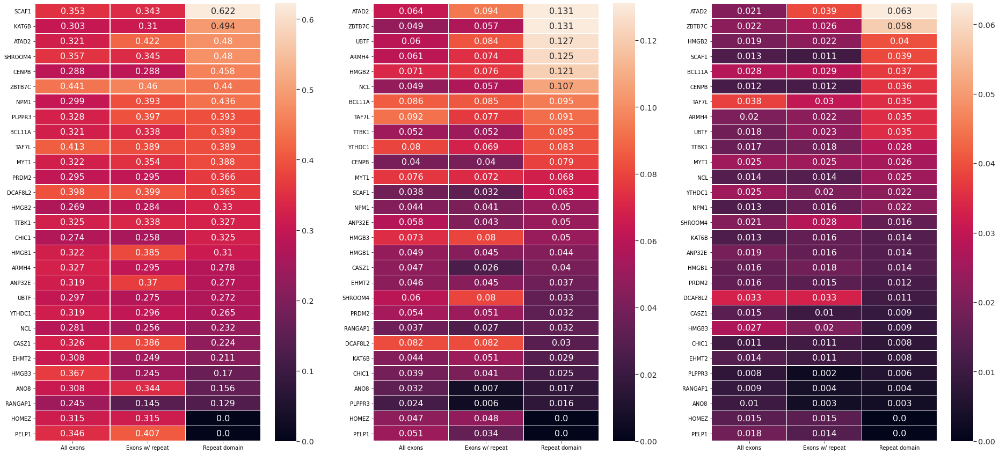


 Mutation type raw count table:


Total                                Missense                  \
        All exons Exons w/ repeat Repeat domain All exons Exons w/ repeat   
ANO8          118               6             1       111               7   
ANP32E         47               8             3        42               6   
ATAD2         269              19            11       242              21   
BCL11A        215             172             6       213             173   
ARMH4         142              19             9       140              19   
CASZ1         249              29             3       252              32   
CENPB          72              72             5        67              67   
CHIC1          26              12             2        20               9   
DCAF8L2       156             155             2       170             170   
EHMT2         162               6             3       145               4   
HMGB1          32               8             4        25               6   
HMGB2          45              12             8        38               9   
HMGB3          44              11             3        38               8   
HOMEZ          78              78             0        74              74   
KAT6B         274              18             3       251              14   
PLPPR3         53               8             1        48               8   
MYT1          256              64            10       259              70   
NCL           104              43            19        87              32   
NPM1           39               5             3        32               2   
PELP1         140              35             0       136              34   
PRDM2         276             225             2       266             222   
RANGAP1        66               5             2        56               4   
SCAF1         149              90             4       142              86   
SHROOM4       268              64             2       270              57   
TAF7L         104              17             6        90              12   
TTBK1         205              83            10       202              76   
UBTF          132              12             8       109              11   
YTHDC1        170              29             5       168              28   
ZBTB7C         91              69            11        90              70   

                       Nonsense                                Deletion  \
        Repeat domain All exons Exons w/ repeat Repeat domain All exons   
ANO8                1         6               0             0         2   
ANP32E              3         5               1             0         1   
ATAD2              14        42               1             0         3   
BCL11A              3         5               5             2         0   
ARMH4               8         8               2             1         1   
CASZ1               4         9               0             0         2   
CENPB               7         4               4             0         2   
CHIC1               0         5               3             2         0   
DCAF8L2             2         9               9             0         1   
EHMT2               1         7               0             0         2   
HMGB1               3         3               3             1         0   
HMGB2               6         3               1             1         4   
HMGB3               2         5               2             0         2   
HOMEZ               0         6               6             0         1   
KAT6B               0        23               2             2         6   
PLPPR3              1         1               0             0         0   
MYT1               10        16               7             1         2   
NCL                12         4               1             0        11   
NPM1                1         1               0             0         2   
PELP1               0         8               2  


 Mutation type as fraction of mutations in a given domain


In [ ]:
#@title Graph generation (in progress)
import matplotlib.pyplot as plt
import numpy as np
from Bio.SubsMat.MatrixInfo import blosum62
import seaborn as sns

columns = pd.MultiIndex.from_product([['Mean tumor allele frequency','Mutation sites per BP', 'Impact score'], ['All exons', 'Exons w/ repeat', 'Repeat domain']])
Mut_HeatMap = pd.DataFrame(index = Gene_list[1:], columns = columns)
columns_raw = pd.MultiIndex.from_product([['Total','Missense','Nonsense','Deletion','Insertion','Splice','FrameShift'], ['All exons', 'Exons w/ repeat', 'Repeat domain']])
columns_div = pd.MultiIndex.from_product([['Missense','Nonsense','Deletion','Insertion','Splice','FrameShift'], ['All exons', 'Exons w/ repeat', 'Repeat domain']])
Mut_TypeMap_raw = pd.DataFrame(index = Gene_list[1:], columns = columns_raw)
Mut_TypeMap_div = pd.DataFrame(index = Gene_list[1:], columns = columns_div)

def Freqfind(rownum1, rownum2, rownum3, rownum4):
    FreqNum = 0
    if rownum4 != 0: # subtract tumor allele frequenies by normal allele frequncy if not 0
        FreqNum = (rownum2 / (rownum1 + rownum2)) - (rownum4 / (rownum3 + rownum4))
    else:
        FreqNum = (rownum2 / (rownum1 + rownum2))
    return FreqNum

def MUTfind(rownum):
    MS = 0 ; FR = 0 ; DEL = 0; INS = 0; SP = 0; NS = 0

    if 'Missense_Mutation' in str(rownum):
        MS += 1
    elif 'Nonsense_Mutation' in str(rownum):
        NS += 1
    elif 'In_Frame_Del' in str(rownum):
        DEL += 1
    elif 'In_Frame_Ins' in str(rownum):
        INS += 1
    elif 'Splice' in str(rownum):
        SP += 1
    elif 'Frame_Shift' in str(rownum):
        FR += 1

    return MS, NS, DEL, INS, SP, FR

def BLOSUMscore(rownum1, rownum2):
    score = 0; 
    if 'Missense_Mutation' in str(rownum):
        ResComb1 = "('" + rownum2 + "', '" + rownum1 + "')" 
        ResComb2 = "('" + rownum1 + "', '" + rownum2 + "')" 
        if ResComb1 in blosum62:
            score = blosum62["'" + rownum2 + "', '" + rownum1 + "'" ]
        if ResComb2 in blosum62:
            score = blosum62["'" + rownum1 + "', '" + rownum2 + "'" ]      
    return score 

print('Generating data tables and graphs: \n'); last = ''
for index, row1 in Gene_dict.iterrows():

    if row1[0] != last:
        LoopNum = 0
        last = row1[0]
        track = row1[3]
        Freq1 = 0; Freq2 = 0; Freq3 = 0
        MutTotal = np.array([0,0,0])
        DomainLen = np.array([row1[8],row1[9],row1[10]])
        Mut_type_all = np.array([0,0,0,0,0,0])
        Mut_type_exons = np.array([0,0,0,0,0,0])
        Mut_type_rep = np.array([0,0,0,0,0,0]) 
        Mut_Pos_list = [' ']
        Blosum_score = np.array([0,0,0])
        New_mut_pos = 'No'

    if LoopNum > 0:
        DomainLen[2] += int(row1[10])
        if track != row1[3]:
            track = row1[3]
            DomainLen[1] += int(row1[9])
    
    LoopNum += 1   

    for index, row2 in Mut_dict.iterrows():

        if row2[13] not in Mut_Pos_list or row2[14] not in Mut_Pos_list:
            Mut_Pos_list = Mut_Pos_list + [row2[13]] + [row2[14]]
            New_mut_pos = 'Yes'
        else:
            New_mut_pos = 'No'

        if row2[0] == row1[0] and LoopNum == 1:
            if New_mut_pos == 'Yes':
                MutTotal[0] += 1
            Mut_type_all += np.array(MUTfind(row2[4]))
            #DE2ED1 = DE2ED1 + DEfind(row2[6][0],row2[6][-1])
            Freq1 += Freqfind(int(row2[16]),int(row2[17]),int(row2[18]),int(row2[19]))
            
            if row2[21] == 'Yes' and LoopNum == 1: 
                if New_mut_pos == 'Yes':
                    MutTotal[1] += 1
                Mut_type_exons += np.array(MUTfind(row2[4]))
                Freq2 += Freqfind(int(row2[16]),int(row2[17]),int(row2[18]),int(row2[19]))

            if row2[22] == 'Yes' and LoopNum == 1:
                if New_mut_pos == 'Yes':
                    MutTotal[2] += 1
                Mut_type_rep += np.array(MUTfind(row2[4]))
                Freq3 += Freqfind(int(row2[16]),int(row2[17]),int(row2[18]),int(row2[19]))    
   
    if MutTotal[0] != 0:
        gene_values = [0,0,0,0,0,0,0,0,0]
        gene_values[0] = Freq1/MutTotal[0]
        gene_values[3] = MutTotal[0]/DomainLen[0]
        gene_values[6] = gene_values[0]*gene_values[3]
                    
        if not MutTotal[1] == 0: 
            gene_values[1] = Freq2/MutTotal[1]
            gene_values[4] = MutTotal[1]/DomainLen[1]
            gene_values[7] = gene_values[1]*gene_values[4]
            
            if not MutTotal[2] == 0:
                gene_values[2] = Freq3/MutTotal[2]
                gene_values[5] = MutTotal[2]/DomainLen[2]
                gene_values[8] = gene_values[2]*gene_values[5]

        MutTypeCmb = []
        MutTypeCmb_div = []

        for i in range(6):
            MutTypeCmb = np.append(MutTypeCmb,Mut_type_all[i])
            MutTypeCmb = np.append(MutTypeCmb,Mut_type_exons[i])
            MutTypeCmb = np.append(MutTypeCmb,Mut_type_rep[i])
            MutTypeCmb_div = np.append(MutTypeCmb_div,(Mut_type_all[i]/MutTotal[0]))
            MutTypeCmb_div = np.append(MutTypeCmb_div,(Mut_type_exons[i]/MutTotal[1]))
            MutTypeCmb_div = np.append(MutTypeCmb_div,(Mut_type_rep[i]/MutTotal[2])) 

        MutTypeCmb_raw = np.append(MutTotal,MutTypeCmb)
        Mut_HeatMap.loc[row1[0]] = gene_values
        Mut_TypeMap_raw.loc[row1[0]] = MutTypeCmb_raw
        Mut_TypeMap_div.loc[row1[0]] = MutTypeCmb_div

Mut_HeatMap = Mut_HeatMap.sort_values([('Impact score', 'Repeat domain')], ascending=False).fillna(0).round(3)
Mut_TypeMap_div = Mut_TypeMap_div.fillna(0).round(3)

print('\n Calculation of mutations')

with pd.option_context("display.max_rows", None, "display.max_columns", None):  
  display(Mut_HeatMap)

Mut_HeatMap1 = Mut_HeatMap.sort_values([('Mean tumor allele frequency', 'Repeat domain')], ascending=False)
Mut_HeatMap2 = Mut_HeatMap.sort_values([('Mutation sites per BP', 'Repeat domain')], ascending=False)
Mut_HeatMap3 = Mut_HeatMap.sort_values([('Impact score', 'Repeat domain')], ascending=False)

print('\n')
print('\n       Mean tumor allele frequency                          Mutation sites per BP                               Impact score')

fig, ax =plt.subplots(1,3,figsize=(32,(len(Gene_list)/2)))

sns.set(font_scale=1.3)
sns.heatmap(Mut_HeatMap1['Mean tumor allele frequency'], linewidths=.5, fmt="",square=False, annot_kws={"size": 16}, annot=True, ax=ax[0])
sns.heatmap(Mut_HeatMap2['Mutation sites per BP'], linewidths=.5, fmt="",square=False, annot_kws={"size": 16}, annot=True, ax=ax[1])
sns.heatmap(Mut_HeatMap3['Impact score'], linewidths=.5, fmt="",square=False, annot_kws={"size": 16}, annot=True, ax=ax[2])
plt.show()

print('\n Mutation type raw count table:')

with pd.option_context("display.max_rows", None, "display.max_columns", None):  
  display(Mut_TypeMap_raw)

print('\n Mutation type as fraction of mutations in a given domain')